In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from scipy.signal import find_peaks
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from scipy.fft import fft, ifft, fftfreq

plt.rc('xtick', labelsize=16) #fontsize of the x tick labels
plt.rc('ytick', labelsize=16) #fontsize of the y tick labels
plt.rc('legend', fontsize=16) #fontsize of the legend

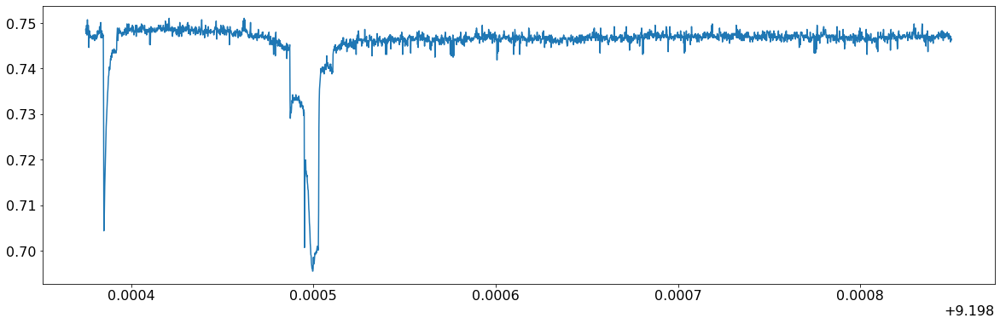

In [5]:
plt.figure(figsize=(20,6))

spec = pd.read_csv('Spec.csv')
plt.plot(x[15000:18000],spec[15000:18000])

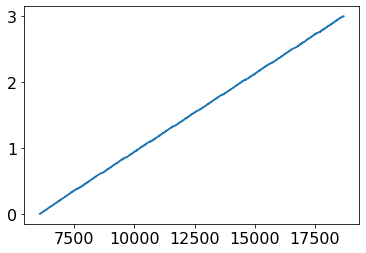

In [6]:
ramp = pd.read_csv('Ramp.csv')
plt.plot(ramp[6069:18700])

x = [i*1.5834e-7+9.196 for i in range(0,len(spec))]

201


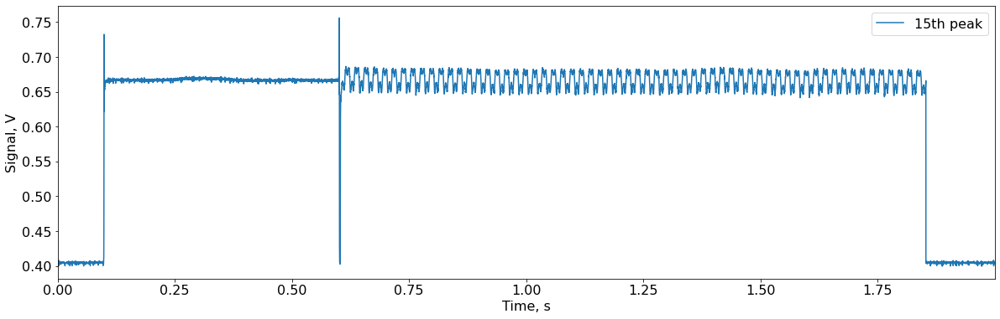

In [7]:
peak_15 = pd.read_csv('scan12-peak15AI3.csv')
scans = list(peak_15.columns)
print(len(scans))

x = [i*0.0001 for i in range(0,len(peak_15[scans[100]]))]

plt.figure(figsize=(20,6))
plt.plot(x,peak_15[scans[100]],label='15th peak')
plt.ylabel('Signal, V',fontsize=16)
plt.xlabel('Time, s',fontsize=16)
plt.legend()
plt.margins(x=0)

plt.savefig('15_peak_50_Hz')

In [19]:
f = [x/10000 for x in list(range(91958500,91962502,20))]

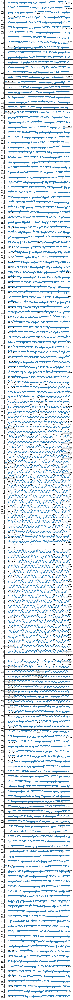

In [20]:
fig,ax = plt.subplots((len(scans)-1),1,figsize=(20,300))


for num in range(0,len(scans)-1):
    
    maxi = max(peak_15[scans[num]][7500:15000])
    mini = min(peak_15[scans[num]][7500:15000])
    
    one = np.array(peak_15[scans[num]][7000:15000]-maxi+(maxi-mini)/2)
    
    #n = one.size
    #timestep = 0.0001  #microsec
    #y = one

    #yf = fft(y)
    #xf = fftfreq(n, d=timestep)
    
    ax[num].plot(one,label=str(f[num])+'MHz')
    ax[num].legend()

plt.savefig('Signals for 15th peak')

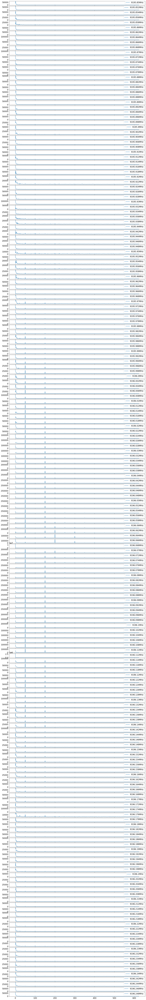

In [21]:
fig,ax = plt.subplots((len(scans)-1),1,figsize=(20,150))

for num in range(0,len(scans)-1):
    
    maxi = max(peak_15[scans[num]][7500:15000])
    mini = min(peak_15[scans[num]][7500:15000])
    
    one = np.array(peak_15[scans[num]][7000:15000]-maxi+(maxi-mini)/2)
    
    n = one.size
    timestep = 0.0001  #microsec
    y = one

    yf = fft(y)
    xf = fftfreq(n, d=timestep)
    
    ax[num].plot(xf[0:500], (n * np.abs(yf[0:500])), label=str(f[num])+'MHz')
    ax[num].legend()
    
plt.savefig('FFT for 15th peak')

In [22]:
Hz_50 = []
Hz_100 = []
Hz_150 = []


for i in range(0,len(scans)):

    maxi = max(np.array(peak_15[scans[i]][6050:18000]))
    mini = min(np.array(peak_15[scans[i]][6050:18000]))

    one = np.array(peak_15[scans[i]][6050:18000]-maxi+(maxi-mini)/2)
           
    n = one.size
    timestep = 0.0001  #microsec
    y = one

    yf = fft(y)
    xf = fftfreq(n, d=timestep)
    
    Hz_50.append(n*np.abs(yf[60]))
    Hz_100.append(n*np.abs(yf[120]))
    Hz_150.append(n*np.abs(yf[180]))

In [23]:
len(Hz_50)

201

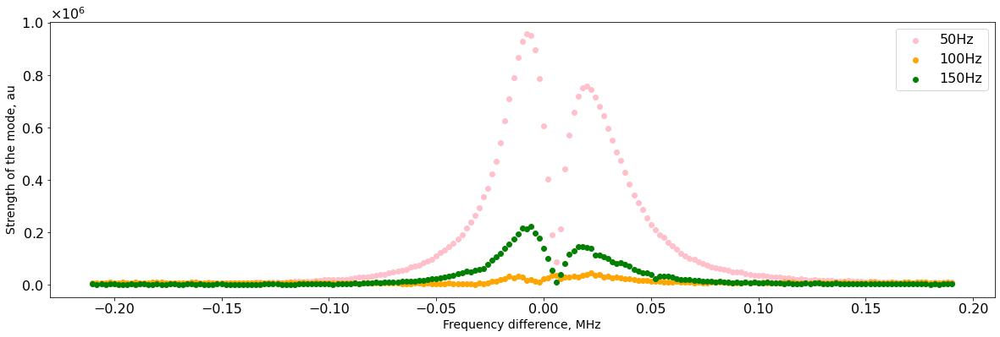

In [24]:
fig, ax = plt.subplots(figsize=(20,6))

#ratio = np.array(Hz_50)/np.array(Hz_150)

len(f)


f_0 = 9196.06#MHz

ax.scatter([x-f_0 for x in f],Hz_50,color='pink',label='50Hz')
ax.scatter([x-f_0 for x in f],Hz_100,color='orange',label='100Hz')
ax.scatter([x-f_0 for x in f],Hz_150,color='green',label='150Hz')

ax.set_xlabel('Frequency difference, MHz',fontsize=14)
ax.set_ylabel('Strength of the mode, au',fontsize=14)

ax.legend(loc='upper right')

from matplotlib import ticker
formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True) 
formatter.set_powerlimits((-1,1)) 
ax.yaxis.set_major_formatter(formatter) 


plt.savefig('Comparison of 50, 100 and 150 modes')

In [25]:
# What are the exact resonances????? CHECK IT BEFORE PPLUGGING TO OVERLEAF!

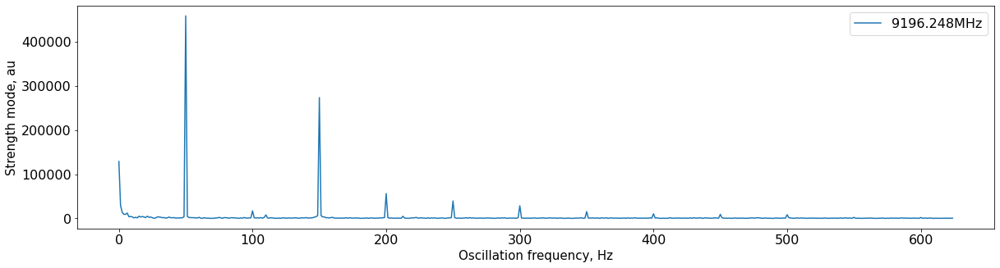

In [26]:
plt.figure(figsize=(20,5))

maxi = max(peak_15[scans[100]][7500:15000])
mini = min(peak_15[scans[100]][7500:15000])
    
one = np.array(peak_15[scans[100]][7000:15000]-maxi+(maxi-mini)/2)
    
n = one.size
timestep = 0.0001  #microsec
y = one

yf = fft(y)
xf = fftfreq(n, d=timestep)
    
plt.plot(xf[0:500], (n * np.abs(yf[0:500])), label=str(f[num])+'MHz')
plt.xlabel('Oscillation frequency, Hz',fontsize=15)
plt.ylabel('Strength mode, au',fontsize=15)
plt.legend()

plt.savefig('Fourier_transform',dpi=300)